In [ ]:
!pip install waymo-open-dataset-tf-2-12-0 --no-deps



   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.8/3.8 MB 95.3 MB/s eta 0:00:00


In [ ]:
import tensorflow as tf
import numpy as np
from waymo_open_dataset import dataset_pb2 as open_dataset
from waymo_open_dataset.utils import frame_utils

SEGMENT_PATH = '/content/individual_files_validation_segment-10203656353524179475_7625_000_7645_000_with_camera_labels.tfrecord'

# Create the dataset FIRST
dataset = tf.data.TFRecordDataset(SEGMENT_PATH, compression_type='')

frames = []
for data in dataset:
    frame = open_dataset.Frame()
    frame.ParseFromString(bytearray(data.numpy()))
    frames.append(frame)

print(f"Frames in this segment: {len(frames)}")
frame = frames[1]
print(f"Timestamp: {frame.timestamp_micros}")
print(f"LiDAR sensors present: {[c.name for c in frame.context.laser_calibrations]}")

Frames in this segment: 198
Timestamp: 1522688015070129
LiDAR sensors present: [2, 5, 3, 4, 1]


In [ ]:
import numpy as np

def get_ego_position(frame):
    """
    frame.pose.transform is a flat 16-element list representing a
    4x4 row-major matrix: vehicle frame -> global frame.
    The translation (x, y, z) is in the last column.
    """
    pose = np.array(frame.pose.transform).reshape(4, 4)
    x, y, z = pose[0, 3], pose[1, 3], pose[2, 3]
    return {'x': round(x, 2), 'y': round(y, 2), 'z': round(z, 2)}

# Sanity check on the frame we've already been using
ego_pos_world = get_ego_position(frame)
print(f"Ego position (world frame): {ego_pos_world}")



Ego position (world frame): {'x': np.float64(7213.04), 'y': np.float64(-1569.33), 'z': np.float64(211.95)}


In [ ]:
def extract_route_from_segment(frames):
    """
    Walk every frame in order and pull the ego position.
    This is the actual path the car drove — our real waypoint route.
    """
    route = []
    for f in frames:
        pos = get_ego_position(f)
        route.append({
            'timestamp': f.timestamp_micros,
            'x': pos['x'],
            'y': pos['y']
        })
    return route

full_route = extract_route_from_segment(frames)
print(f"Total recorded positions: {len(full_route)}")
print(f"First: {full_route[0]}")
print(f"Last:  {full_route[-1]}")


Total recorded positions: 198
First: {'timestamp': 1522688014970187, 'x': np.float64(7213.27), 'y': np.float64(-1571.12)}
Last:  {'timestamp': 1522688034667097, 'x': np.float64(7056.82), 'y': np.float64(-1265.47)}


In [ ]:
def distance(x1, y1, x2, y2):
    return np.sqrt((x1 - x2)**2 + (y1 - y2)**2)

def downsample_route(route, min_spacing_m=10.0):
    """
    Raw per-frame positions are only ~1m apart at driving speed.
    Keep a point only once we've moved min_spacing_m from the last
    kept waypoint — this gives a sensible, sparse waypoint list.
    """
    if not route:
        return []

    waypoints = [route[0]]
    for point in route[1:]:
        last = waypoints[-1]
        d = distance(last['x'], last['y'], point['x'], point['y'])
        if d >= min_spacing_m:
            waypoints.append(point)

    return waypoints

WAYPOINTS_REAL = downsample_route(full_route, min_spacing_m=10.0)
print(f"Downsampled from {len(full_route)} frames to {len(WAYPOINTS_REAL)} waypoints")
for wp in WAYPOINTS_REAL[:5]:
    print(wp)


Downsampled from 198 frames to 32 waypoints
{'timestamp': 1522688014970187, 'x': np.float64(7213.27), 'y': np.float64(-1571.12)}
{'timestamp': 1522688015569695, 'x': np.float64(7211.67), 'y': np.float64(-1560.32)}
{'timestamp': 1522688016169032, 'x': np.float64(7209.67), 'y': np.float64(-1549.55)}
{'timestamp': 1522688016768025, 'x': np.float64(7207.14), 'y': np.float64(-1538.4)}
{'timestamp': 1522688017367247, 'x': np.float64(7204.05), 'y': np.float64(-1527.14)}


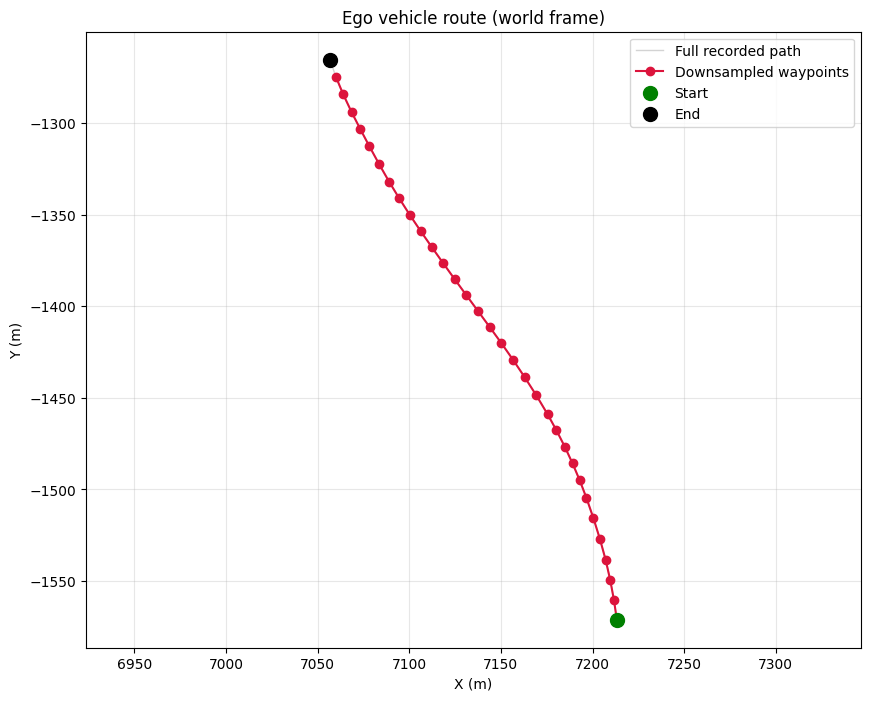

In [ ]:
import matplotlib.pyplot as plt

xs_full = [p['x'] for p in full_route]
ys_full = [p['y'] for p in full_route]

xs_wp = [p['x'] for p in WAYPOINTS_REAL]
ys_wp = [p['y'] for p in WAYPOINTS_REAL]

plt.figure(figsize=(10, 8))
plt.plot(xs_full, ys_full, '-', color='lightgray', linewidth=1, label='Full recorded path')
plt.plot(xs_wp, ys_wp, 'o-', color='crimson', markersize=6, label='Downsampled waypoints')
plt.scatter([xs_full[0]], [ys_full[0]], color='green', s=100, zorder=5, label='Start')
plt.scatter([xs_full[-1]], [ys_full[-1]], color='black', s=100, zorder=5, label='End')
plt.title('Ego vehicle route (world frame)')
plt.xlabel('X (m)')
plt.ylabel('Y (m)')
plt.axis('equal')
plt.legend()
plt.grid(alpha=0.3)
plt.show()


In [ ]:
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

xs_full = [p['x'] for p in full_route]
ys_full = [p['y'] for p in full_route]

fig, ax = plt.subplots(figsize=(10, 8))
ax.plot(xs_full, ys_full, '-', color='lightgray', linewidth=1, label='Full recorded path')
ax.scatter([xs_full[0]], [ys_full[0]], color='green', s=100, zorder=5, label='Start')
ax.scatter([xs_full[-1]], [ys_full[-1]], color='black', s=100, zorder=5, label='End')

# Elements that get updated each frame
ego_dot, = ax.plot([], [], 'o', color='crimson', markersize=10, zorder=6, label='Ego (current frame)')
trail_line, = ax.plot([], [], '-', color='crimson', linewidth=2, alpha=0.6)

ax.set_title('Ego vehicle route — animated over all frames')
ax.set_xlabel('X (m)')
ax.set_ylabel('Y (m)')
ax.axis('equal')
ax.grid(alpha=0.3)
ax.legend(loc='upper right')

def init():
    ego_dot.set_data([], [])
    trail_line.set_data([], [])
    return ego_dot, trail_line

def update(frame_idx):
    ego_dot.set_data([xs_full[frame_idx]], [ys_full[frame_idx]])
    trail_line.set_data(xs_full[:frame_idx+1], ys_full[:frame_idx+1])
    ax.set_title(f'Ego vehicle route — frame {frame_idx+1}/{len(full_route)}')
    return ego_dot, trail_line

anim = animation.FuncAnimation(
    fig, update, frames=len(full_route),
    init_func=init, interval=100, blit=False
)

plt.close(fig)  # prevents a static duplicate plot from also rendering
HTML(anim.to_jshtml())

In [ ]:
from waymo_open_dataset import label_pb2

def get_objects_from_frame_with_motion(frame):
    """
    Extract all labeled objects (vehicles, pedestrians, cyclists, signs)
    from a frame, including position, size, heading, and motion (velocity/accel).

    Returns a list of dicts, one per object.
    """
    objects = []

    type_names = {
        label_pb2.Label.TYPE_UNKNOWN: 'unknown',
        label_pb2.Label.TYPE_VEHICLE: 'vehicle',
        label_pb2.Label.TYPE_PEDESTRIAN: 'pedestrian',
        label_pb2.Label.TYPE_SIGN: 'sign',
        label_pb2.Label.TYPE_CYCLIST: 'cyclist',
    }

    for label in frame.laser_labels:
        box = label.box
        meta = label.metadata  # velocity / acceleration info

        speed = np.sqrt(meta.speed_x**2 + meta.speed_y**2)

        objects.append({
            'id': label.id,
            'type': type_names.get(label.type, 'unknown'),
            # position, world-relative-to-vehicle (box is already in vehicle frame)
            'x': round(box.center_x, 2),
            'y': round(box.center_y, 2),
            'z': round(box.center_z, 2),
            'length': round(box.length, 2),
            'width': round(box.width, 2),
            'height': round(box.height, 2),
            'heading': round(box.heading, 3),  # radians
            # motion
            'speed_x': round(meta.speed_x, 2),
            'speed_y': round(meta.speed_y, 2),
            'speed': round(speed, 2),
            'accel_x': round(meta.accel_x, 2),
            'accel_y': round(meta.accel_y, 2),
        })

    return objects

# Example usage
objects_this_frame = get_objects_from_frame_with_motion(frame)
print(f"Objects detected: {len(objects_this_frame)}")
for obj in objects_this_frame[:5]:
    print(obj)

Objects detected: 50
{'id': '-5-3DULJubg1suqUi4Mdtw', 'type': 'sign', 'x': -11.48, 'y': -14.92, 'z': 0.65, 'length': 0.11, 'width': 0.53, 'height': 0.63, 'heading': -3.134, 'speed_x': 0.01, 'speed_y': 0.04, 'speed': np.float64(0.04), 'accel_x': 0.0, 'accel_y': 0.0}
{'id': '-KpKb_7UDmsdQCf8FS3g9w', 'type': 'vehicle', 'x': -11.16, 'y': -2.45, 'z': 0.86, 'length': 5.01, 'width': 2.12, 'height': 1.79, 'heading': 0.048, 'speed_x': -4.14, 'speed_y': 12.11, 'speed': np.float64(12.8), 'accel_x': 1.09, 'accel_y': -0.61}
{'id': '5t83kllBdeRH4jlXEkNvUw', 'type': 'sign', 'x': 38.89, 'y': -22.65, 'z': 1.09, 'length': 0.69, 'width': 1.07, 'height': 1.04, 'heading': 2.916, 'speed_x': 0.0, 'speed_y': 0.0, 'speed': np.float64(0.0), 'accel_x': 0.0, 'accel_y': 0.0}
{'id': '68U1Ed5pQGzkDg9rA33zuA', 'type': 'vehicle', 'x': 29.37, 'y': 68.01, 'z': -0.57, 'length': 5.08, 'width': 2.02, 'height': 1.7, 'heading': -1.672, 'speed_x': 0.0, 'speed_y': -0.0, 'speed': np.float64(0.0), 'accel_x': 0.0, 'accel_y': -0.0

In [ ]:
import os
import numpy as np
from PIL import Image
import tensorflow as tf
from waymo_open_dataset import dataset_pb2 as open_dataset

OUTPUT_DIR = '/content/front_cam_frames'
os.makedirs(OUTPUT_DIR, exist_ok=True)

def get_front_camera_image(frame):
    """
    frame.images is a list of CameraImage protos, one per camera.
    We want the one where name == FRONT.
    """
    for img in frame.images:
        if img.name == open_dataset.CameraName.FRONT:
            # img.image is raw JPEG bytes
            decoded = tf.image.decode_jpeg(img.image).numpy()
            return decoded
    return None  # front camera missing from this frame (rare, but possible)

saved_paths = []

for i, frame in enumerate(frames):
    img_array = get_front_camera_image(frame)
    if img_array is None:
        print(f"Frame {i}: no FRONT image found, skipping")
        continue

    pil_img = Image.fromarray(img_array)
    filename = f"frame_{i:03d}_t{frame.timestamp_micros}.jpg"
    filepath = os.path.join(OUTPUT_DIR, filename)
    pil_img.save(filepath)
    saved_paths.append(filepath)

print(f"Saved {len(saved_paths)} front camera images to {OUTPUT_DIR}")
print(f"Example: {saved_paths[0]}")

Saved 198 front camera images to /content/front_cam_frames
Example: /content/front_cam_frames/frame_000_t1522688014970187.jpg


In [ ]:
def world_to_vehicle_frame(world_point, frame):
    """
    Transform a world-frame (x, y) point into the current frame's
    vehicle-relative frame, using the inverse of frame.pose.
    """
    pose = np.array(frame.pose.transform).reshape(4, 4)
    pose_inv = np.linalg.inv(pose)

    world_vec = np.array([world_point['x'], world_point['y'], 0.0, 1.0])
    vehicle_vec = pose_inv @ world_vec

    return {'x': round(vehicle_vec[0], 2), 'y': round(vehicle_vec[1], 2)}

# Example: express the next waypoint relative to the current frame
next_wp_world = WAYPOINTS_REAL[1]
next_wp_vehicle = world_to_vehicle_frame(next_wp_world, frame)
print(f"Waypoint (world):   {next_wp_world}")
print(f"Waypoint (vehicle): {next_wp_vehicle}")


Waypoint (world):   {'timestamp': 1522688015569695, 'x': np.float64(7211.67), 'y': np.float64(-1560.32)}
Waypoint (vehicle): {'x': np.float64(-327.18), 'y': np.float64(-67.85)}


In [ ]:
# Traffic light state — reusing the same simplified state model
# from the Traffic Light Behavior topic (kept local here since we
# don't have real signal-state labels in the Waymo laser/camera data)
LIGHT_STATES = ['GREEN', 'YELLOW', 'RED']

def light_decision(light_state):
    """Same rule as the traffic light topic: RED/YELLOW force a stop."""
    if light_state in ('RED', 'YELLOW'):
        return 'STOP'
    return 'GO'


print("Pipeline layers, in priority order:")
print("  1. Object risk check      -> frame_decision_physics()")
print("  2. Right-of-way check     -> right_of_way_decision()")
print("  3. Traffic light check    -> light_decision()")
print("  4. Waypoint following     -> get_target_waypoint() / heading_to_target()")


Pipeline layers, in priority order:
  1. Object risk check      -> frame_decision_physics()
  2. Right-of-way check     -> right_of_way_decision()
  3. Traffic light check    -> light_decision()
  4. Waypoint following     -> get_target_waypoint() / heading_to_target()


In [ ]:
def frame_decision_pipeline(frame, current_speed_kmh, ego_pos, ego_heading_deg,
                             waypoints, waypoint_index, ego_movement='STRAIGHT',
                             light_state='GREEN'):
    trace = {'frame_timestamp': frame.timestamp_micros}

    # Rebuild objects fresh from this frame's real Waymo labels
    objects = get_objects_from_frame_with_motion(frame)
    trace['num_objects'] = len(objects)

    # --- Layer 1: object risk check (safety first) ---
    safety_decision, safety_triggers = frame_decision_physics(objects, current_speed_kmh)
    trace['safety_decision'] = safety_decision
    trace['safety_triggers'] = safety_triggers

    if safety_decision == 'BRAKE':
        trace['final_action'] = 'BRAKE'
        trace['reason'] = 'object_risk'
        return trace, objects, waypoint_index

    # placeholder — continued in next slide
    trace['final_action'] = None
    return trace, objects, waypoint_index


In [ ]:
def frame_decision_pipeline(frame, current_speed_kmh, ego_pos, ego_heading_deg,
                             waypoints, waypoint_index, ego_movement='STRAIGHT',
                             light_state='GREEN'):
    trace = {'frame_timestamp': frame.timestamp_micros}

    objects = get_objects_from_frame_with_motion(frame)
    trace['num_objects'] = len(objects)

    # --- Layer 1: object risk check ---
    safety_decision, safety_triggers = frame_decision_physics(objects, current_speed_kmh)
    trace['safety_decision'] = safety_decision
    trace['safety_triggers'] = safety_triggers

    if safety_decision == 'BRAKE':
        trace['final_action'] = 'BRAKE'
        trace['reason'] = 'object_risk'
        return trace, objects, waypoint_index

    # --- Layer 2: right-of-way / yield check ---
    row_decision, row_triggers = right_of_way_decision(objects, ego_movement)
    trace['row_decision'] = row_decision
    trace['row_triggers'] = row_triggers

    if row_decision == 'YIELD':
        trace['final_action'] = 'YIELD'
        trace['reason'] = 'right_of_way'
        return trace, objects, waypoint_index

    # --- Layer 3: traffic light check ---
    light_action = light_decision(light_state)
    trace['light_state'] = light_state
    trace['light_action'] = light_action

    if light_action == 'STOP':
        trace['final_action'] = 'STOP'
        trace['reason'] = 'traffic_light'
        return trace, objects, waypoint_index

    # placeholder — continued in next slide
    trace['final_action'] = None
    return trace, objects, waypoint_index



In [ ]:
def frame_decision_pipeline(frame, current_speed_kmh, ego_pos, ego_heading_deg,
                             waypoints, waypoint_index, ego_movement='STRAIGHT',
                             light_state='GREEN'):
    trace = {'frame_timestamp': frame.timestamp_micros}

    objects = get_objects_from_frame_with_motion(frame)
    trace['num_objects'] = len(objects)

    # --- Layer 1: object risk check ---
    safety_decision, safety_triggers = frame_decision_physics(objects, current_speed_kmh)
    trace['safety_decision'] = safety_decision
    trace['safety_triggers'] = safety_triggers

    if safety_decision == 'BRAKE':
        trace['final_action'] = 'BRAKE'
        trace['reason'] = 'object_risk'
        return trace, objects, waypoint_index

    # --- Layer 2: right-of-way / yield check ---
    row_decision, row_triggers = right_of_way_decision(objects, ego_movement)
    trace['row_decision'] = row_decision
    trace['row_triggers'] = row_triggers

    if row_decision == 'YIELD':
        trace['final_action'] = 'YIELD'
        trace['reason'] = 'right_of_way'
        return trace, objects, waypoint_index

    # --- Layer 3: traffic light check ---
    light_action = light_decision(light_state)
    trace['light_state'] = light_state
    trace['light_action'] = light_action

    if light_action == 'STOP':
        trace['final_action'] = 'STOP'
        trace['reason'] = 'traffic_light'
        return trace, objects, waypoint_index

    # --- Layer 4: default — waypoint following ---
    target, waypoint_index = get_target_waypoint(ego_pos, waypoints, waypoint_index)
    if target:
        target_heading, heading_diff = heading_to_target(ego_pos, ego_heading_deg, target)
        steer = steer_decision(heading_diff)
        trace['target_waypoint'] = target
        trace['heading_diff'] = heading_diff
    else:
        steer = 'ROUTE_COMPLETE'
        trace['target_waypoint'] = None

    trace['final_action'] = steer
    trace['reason'] = 'waypoint_following'
    return trace, objects, waypoint_index



In [ ]:
ego_pos_local = {'x': 0.0, 'y': 0.0}
ego_heading_local = 0.0
waypoint_index = 0
SIMULATED_SPEED_KMH = 20

# Simulated light states across the sequence, since real signal-state
# labels aren't part of the Waymo laser data (reuses the same
# simplified light model from the Traffic Light Behavior topic)
simulated_light_sequence = ['GREEN'] * 10 + ['YELLOW', 'YELLOW', 'RED'] + ['GREEN'] * 2

print(f"{'Frame':<6}{'Timestamp':<18}{'Objects':<9}{'Safety':<10}{'RoW':<9}{'Light':<8}{'Final Action':<15}Reason")
print("-" * 95)

for i, f in enumerate(frames[0:15]):
    light_state = simulated_light_sequence[i % len(simulated_light_sequence)]

    # Recompute this frame's waypoints in its own vehicle-relative frame
    waypoints_this_frame = [world_to_vehicle_frame(wp, f) for wp in WAYPOINTS_REAL]

    trace, objects, waypoint_index = frame_decision_pipeline(
        f, SIMULATED_SPEED_KMH, ego_pos_local, ego_heading_local,
        waypoints_this_frame, waypoint_index,
        ego_movement='STRAIGHT', light_state=light_state
    )

    print(f"{i:<6}{trace['frame_timestamp']:<18}{trace['num_objects']:<9}"
          f"{trace['safety_decision']:<10}{trace.get('row_decision', '-'):<9}"
          f"{trace.get('light_state', '-'):<8}{trace['final_action']:<15}{trace['reason']}")



Frame Timestamp         Objects  Safety    RoW      Light   Final Action   Reason
-----------------------------------------------------------------------------------------------


NameError: name 'frame_decision_physics' is not defined